In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from sklearn.preprocessing import MinMaxScaler

In [3]:
data = pd.read_csv("veri16.txt",sep=';')

data = data.drop(["no"] , axis = 1)

data["PT_orani"] = data["Prim"] / data["Teminat"]  

data.describe()
data.isnull().any()  # null değer yok

data.head()

,sirano,Yas,Cinsiyet,Medenidurum,Egitimdurum,Meslek,Gelir,Kampanya,Gorusme_turu,Sigorta_cinsi,Teminat,Prim,kampanya_grubu,Musteri_Tercihi,Onerilen_Iletisim,Onerilen_Iletisim_zamani,Onerilen_Dil,Musteri_Sinifi,PT_orani
0,35140.0,21,Kadın,Boşanmış,Önlisans,Manager,33560,kampanya2,Email,kampanya1,910577.0,2270,Aile,Yüz yüze toplantı,Phone,Sabah,İspanyolca,Sınıf5,0.002493
1,56120.0,26,Erkek,Bekar,Lisans,Doctor,40364,kampanya4,Telefon,kampanya5,598941.0,1494,Grup,Telefon,Mail,Sabah,Çince,Sınıf1,0.002494
2,34041.0,51,Kadın,Boşanmış,Önlisans,Teacher,130849,kampanya3,Telefon Uygulaması,kampanya4,408965.0,4017,Bireysel,Telefon,Phone,Akşam,Fransızca,Sınıf2,0.009822
3,70040.0,19,Kadın,Dul,Doktora,Entrepreneur,103781,kampanya2,Telefon,kampanya5,277443.0,651,Bireysel,Telefon,Mail,Akşam,Fransızca,Sınıf4,0.002346
4,84362.0,24,Erkek,Boşanmış,Önlisans,Manager,33665,kampanya2,Yüz yüze,kampanya3,807983.0,3726,Grup,Yüz yüze toplantı,Yüz yüze toplantı,Sabah,Almanca,Sınıf1,0.004611


In [4]:
# siniflama = data.groupby('Musteri_Sinifi').get_group('Sınıf1')
sinif_1 = data.loc[data.Musteri_Sinifi == "Sınıf1" , ]  
sinif_2 = data.loc[data.Musteri_Sinifi == "Sınıf2" , ]
sinif_3 = data.loc[data.Musteri_Sinifi == "Sınıf3" , ]
sinif_4 = data.loc[data.Musteri_Sinifi == "Sınıf4" , ]
sinif_5 = data.loc[data.Musteri_Sinifi == "Sınıf5" , ]

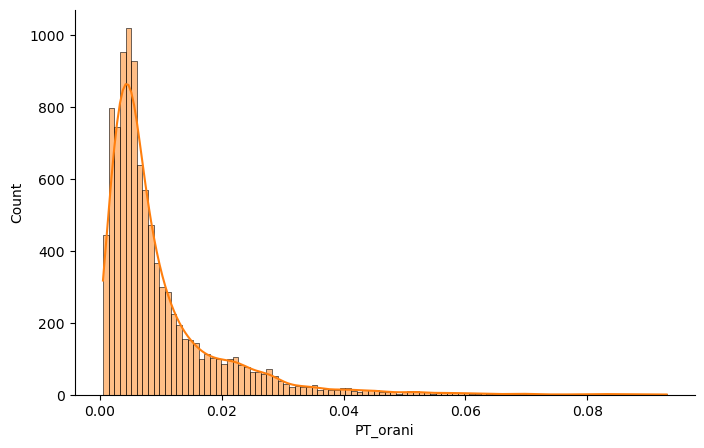

In [5]:
# dağılım grafiği
f, ax = plt.subplots(figsize=(8, 5))
sns.despine(f)
sns.histplot(data["PT_orani"], bins=100, color="tab:orange", kde=True)
plt.show()


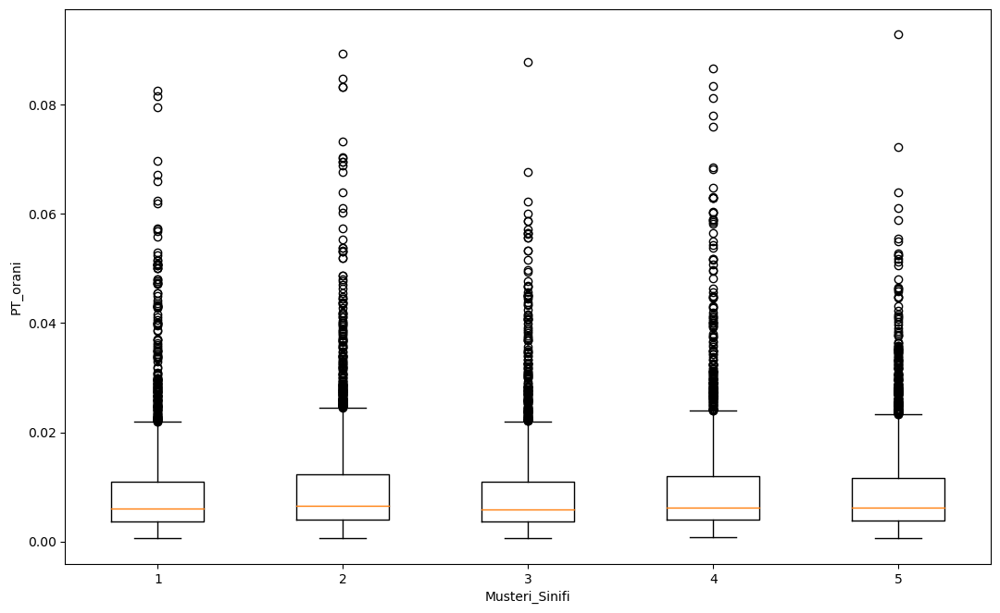

In [6]:
#boxplot
bplot = [sinif_1["PT_orani"], sinif_2["PT_orani"], sinif_3["PT_orani"], sinif_4["PT_orani"],sinif_5["PT_orani"]]
fig = plt.figure(figsize =(10, 6))
ax = fig.add_axes([0, 0, 1, 1])
bp = ax.boxplot(bplot)
plt.xlabel("Musteri_Sinifi")
plt.ylabel("PT_orani")
plt.show()

In [7]:
data['ln_PT_orani'] = data['PT_orani'].apply(np.log)
# siniflama = data.groupby('Musteri_Sinifi').get_group('Sınıf1')
sinif_1 = data.loc[data.Musteri_Sinifi == "Sınıf1" , ]  
sinif_2 = data.loc[data.Musteri_Sinifi == "Sınıf2" , ]
sinif_3 = data.loc[data.Musteri_Sinifi == "Sınıf3" , ]
sinif_4 = data.loc[data.Musteri_Sinifi == "Sınıf4" , ]
sinif_5 = data.loc[data.Musteri_Sinifi == "Sınıf5" , ]

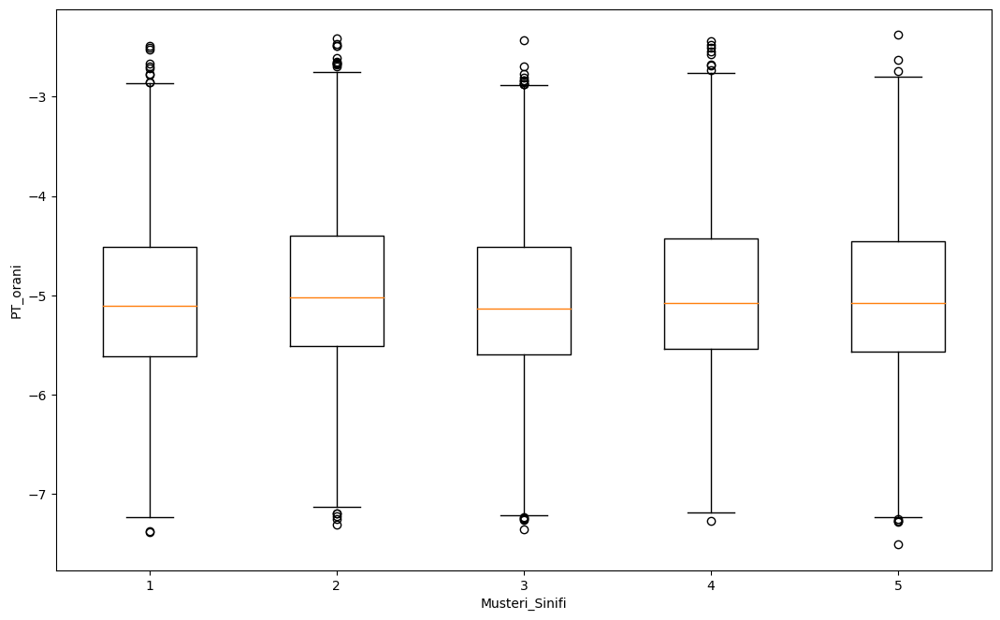

In [8]:
# dönüşümlü boxplot
bplot_ln = [sinif_1["ln_PT_orani"], sinif_2["ln_PT_orani"], sinif_3["ln_PT_orani"], sinif_4["ln_PT_orani"],sinif_5["ln_PT_orani"]]
fig = plt.figure(figsize =(10, 6))
ax = fig.add_axes([0, 0, 1, 1])
bp = ax.boxplot(bplot_ln)
plt.xlabel("Musteri_Sinifi")
plt.ylabel("PT_orani")
plt.show()

In [9]:
data.head()

,sirano,Yas,Cinsiyet,Medenidurum,Egitimdurum,Meslek,Gelir,Kampanya,Gorusme_turu,Sigorta_cinsi,Teminat,Prim,kampanya_grubu,Musteri_Tercihi,Onerilen_Iletisim,Onerilen_Iletisim_zamani,Onerilen_Dil,Musteri_Sinifi,PT_orani,ln_PT_orani
0,35140.0,21,Kadın,Boşanmış,Önlisans,Manager,33560,kampanya2,Email,kampanya1,910577.0,2270,Aile,Yüz yüze toplantı,Phone,Sabah,İspanyolca,Sınıf5,0.002493,-5.994299
1,56120.0,26,Erkek,Bekar,Lisans,Doctor,40364,kampanya4,Telefon,kampanya5,598941.0,1494,Grup,Telefon,Mail,Sabah,Çince,Sınıf1,0.002494,-5.993706
2,34041.0,51,Kadın,Boşanmış,Önlisans,Teacher,130849,kampanya3,Telefon Uygulaması,kampanya4,408965.0,4017,Bireysel,Telefon,Phone,Akşam,Fransızca,Sınıf2,0.009822,-4.623094
3,70040.0,19,Kadın,Dul,Doktora,Entrepreneur,103781,kampanya2,Telefon,kampanya5,277443.0,651,Bireysel,Telefon,Mail,Akşam,Fransızca,Sınıf4,0.002346,-6.054861
4,84362.0,24,Erkek,Boşanmış,Önlisans,Manager,33665,kampanya2,Yüz yüze,kampanya3,807983.0,3726,Grup,Yüz yüze toplantı,Yüz yüze toplantı,Sabah,Almanca,Sınıf1,0.004611,-5.379206


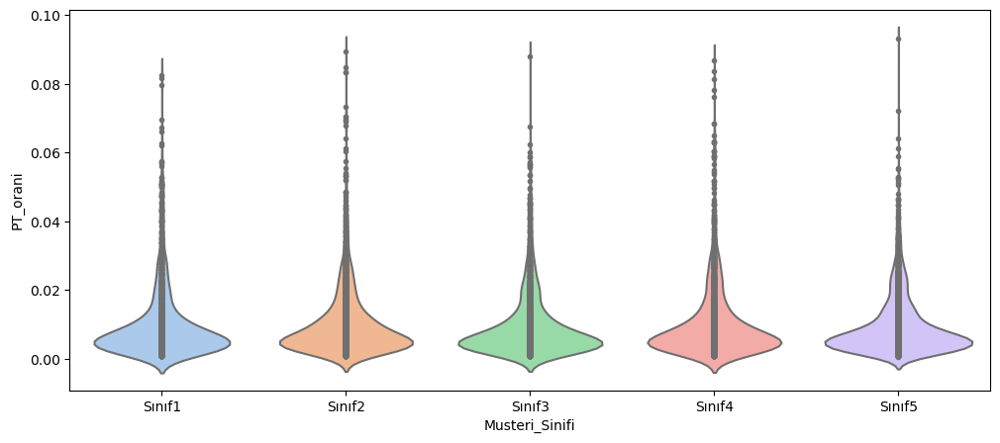

In [10]:
#violinplot
siniflar = pd.concat([sinif_1,sinif_2,sinif_3,sinif_4,sinif_5])
fig = plt.figure(figsize =(12, 5))
sns.violinplot(data=siniflar, x = "Musteri_Sinifi", y="PT_orani" ,inner="points" , linewidth = 1.5 , palette="pastel")
plt.show()

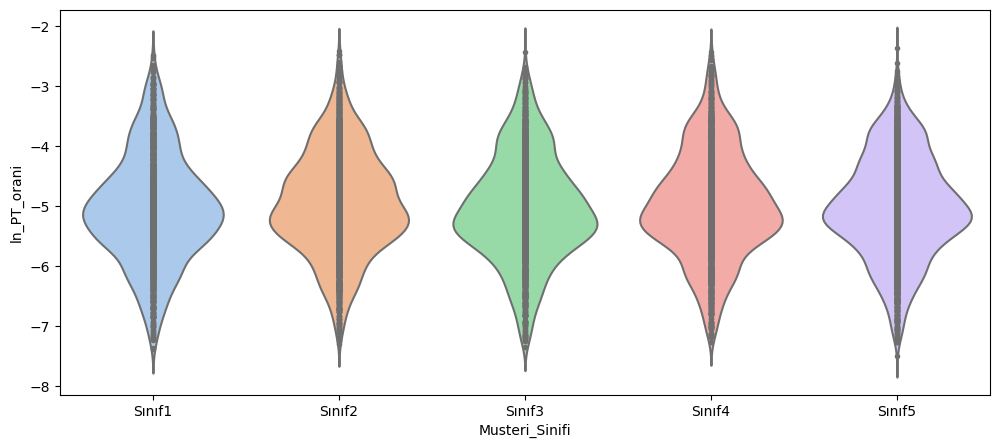

In [11]:
siniflar = pd.concat([sinif_1,sinif_2,sinif_3,sinif_4,sinif_5])
fig = plt.figure(figsize =(12, 5))
sns.violinplot(data=siniflar, x = "Musteri_Sinifi", y="ln_PT_orani" ,inner="points" , linewidth = 1.5 , palette="pastel")
plt.show()

In [12]:
subdata = data[["Yas","Gelir","Prim","Teminat","ln_PT_orani"]]
subdata.head()

scaler = MinMaxScaler()

standart_subdata = scaler.fit_transform(subdata)

In [13]:
standart_subdata = pd.DataFrame(standart_subdata)

standart_subdata.columns = ["Yas","Gelir","Prim","Teminat","ln_PT_orani"]

standart_subdata.head()

,Yas,Gelir,Prim,Teminat,ln_PT_orani
0,0.057692,0.104302,0.393333,0.905870,0.294704
1,0.153846,0.156641,0.220889,0.577832,0.294819
2,0.634615,0.852690,0.781556,0.377857,0.561941
3,0.019231,0.644471,0.033556,0.239413,0.282901
4,0.115385,0.105109,0.716889,0.797877,0.414581


E:\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


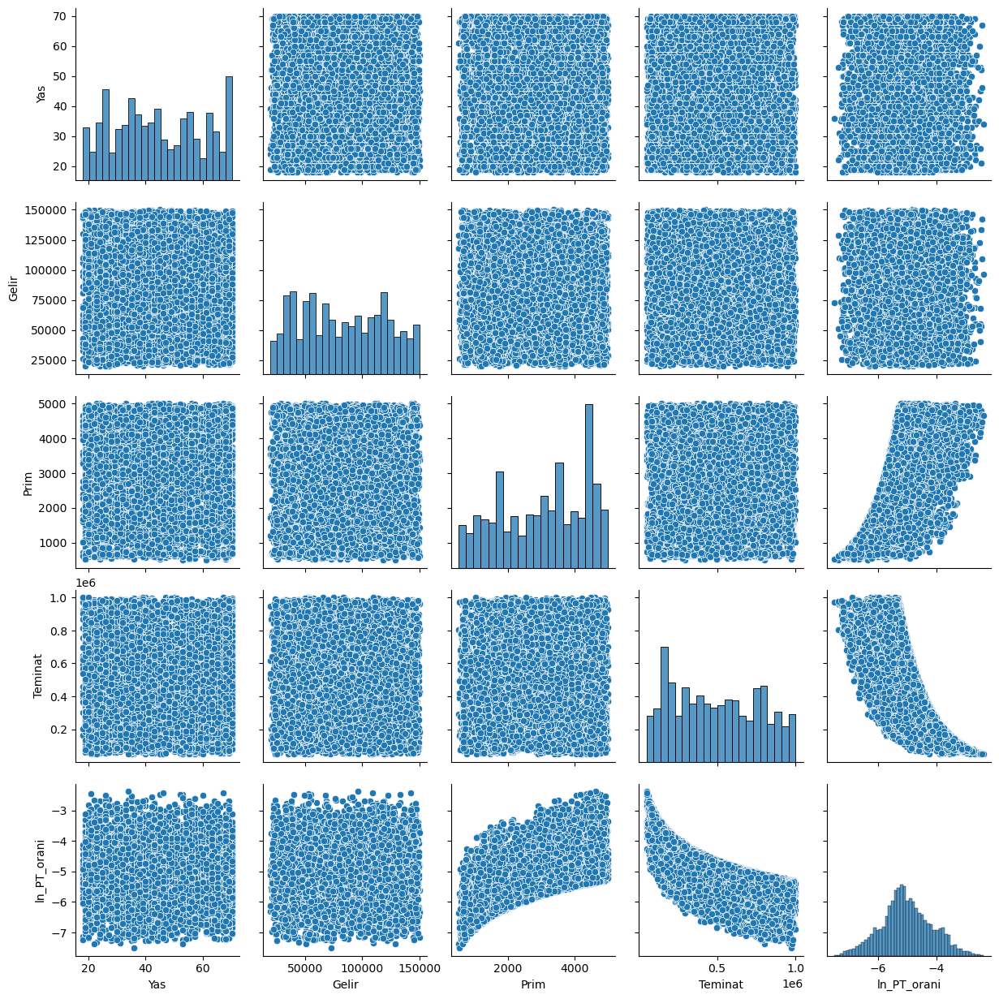

In [14]:
sns.pairplot(subdata)
plt.show()

E:\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


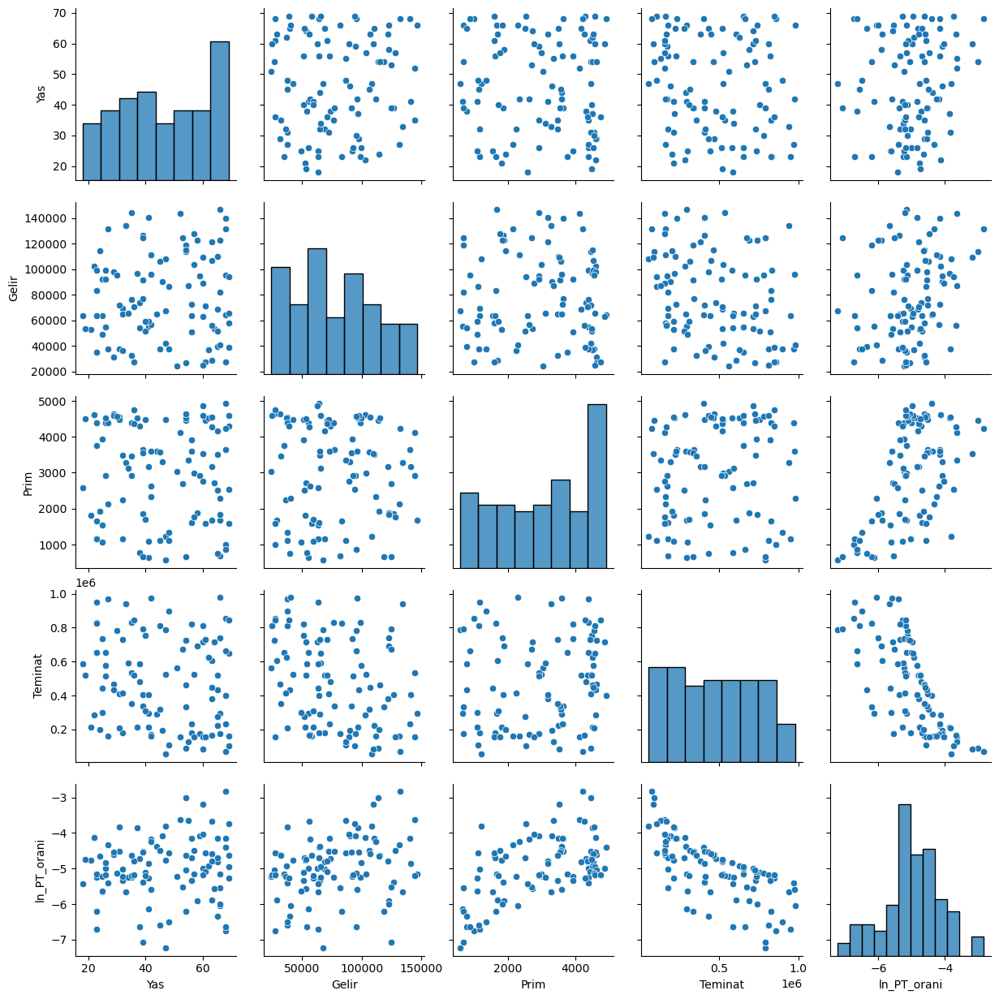

In [15]:
subdata_1 = subdata.sample(n=100, random_state=42)
sns.pairplot(subdata_1)
plt.show()

Text(0.5, 1.0, 'Heatmap')

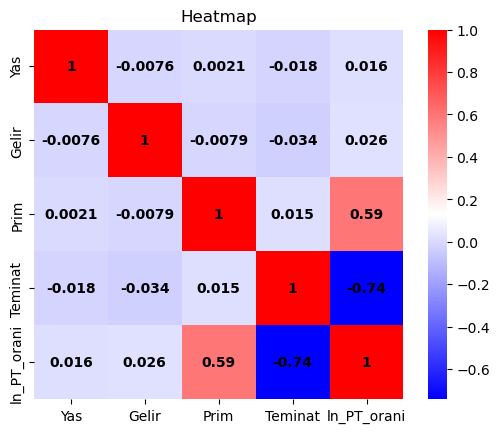

In [16]:
corr_matrix = subdata.corr()
sns.heatmap(corr_matrix , annot=True , cmap= "bwr", annot_kws={'fontsize':10, 'fontweight': 'bold', 'color': 'black'} , square=True)
plt.title("Heatmap")

In [17]:
fig = go.Figure()

for col in subdata.columns:
    fig.add_trace(go.Scatter(x=subdata[col], y=subdata.index, mode='markers', name=col))

fig.update_layout(title='Değişkenlerin İnteraktif Scatter Plotu',
                  xaxis_title='Değerler',
                  yaxis_title='Index')

fig.show()


In [18]:
fig = go.Figure()

for col in subdata.columns:
    fig.add_trace(go.Scatter(x=subdata[col], y=subdata.index, mode='markers', name=col))

fig.update_layout(title='Değişkenlerin İnteraktif Scatter Plotu',
                  xaxis_title='Değerler',
                  yaxis_title='Index')
fig.show()


In [19]:
# Paralel koordinatlar grafiği
fig = go.Figure(data=go.Parcoords(
                  line=dict(color=data['Yas'], colorscale='Viridis', showscale=True),
                  dimensions=list([
                      dict(range=[min(data['Yas']), max(data['Yas'])],
                           label='Yas', values=data['Yas']),
                      dict(range=[min(data['Gelir']), max(data['Gelir'])],
                           label='Gelir', values=data['Gelir']),
                      dict(range=[min(data['Prim']), max(data['Prim'])],
                           label='Prim', values=data['Prim']),
                      dict(range=[min(data['Teminat']), max(data['Teminat'])],
                           label='Teminat', values=data['Teminat']),
                      dict(range=[min(data['ln_PT_orani']), max(data['ln_PT_orani'])],
                           label='PT_Oranı', values=data['ln_PT_orani'])
                  ])
              ))

fig.update_layout(title='Değişkenlerin Paralel Koordinatlar Grafiği')
fig.show()
